In [1]:
### INSTRUCTION MANUEL:
### Step 1: Some extra libraries that need to be installed:
#!conda install -c plotly plotly
#!conda install -c conda-forge folium
#!conda install -c conda-forge branca

### Step 2: Run the 'Database_Ingestion_Script.ipynb' before running this code

# Note:
# Files that need to be kept along with this code:
# 1. California_Fire_Incidents.csv
# 2. Database_Ingestion_Script.ipynb
# 3. ca-county-boundaries.geojson

In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import sqlite3
from sqlite3 import Error
import plotly.express as px

In [3]:
def create_connection(db_file):
    conn = None
    try:
        conn = sqlite3.connect(db_file)
        conn.execute("PRAGMA foreign_keys = 1")
    except Error as e:
        print(e)

    return conn

In [4]:
normalized_database_filename = 'normalized.db'
# Delete old database file
conn_norm = create_connection(normalized_database_filename)

### How many incidents have the counties experienced over the years?

In [5]:
df4= pd.read_sql_query("""SELECT IncidentID,c.CountyID,County,Latitude,Longitude,Location,Year from 
                        Incident_Details i join Location_Details l on i.LocationID=l.LocationID join
                        County_Details c on l.CountyID=c.CountyID""", conn_norm)
display(df4)

,IncidentID,CountyID,County,Latitude,Longitude,Location,Year
0,1,1,Tuolumne,37.857000,-120.086000,3 miles east of Groveland along Hwy 120,2013
1,2,2,Los Angeles,34.585595,-118.423176,Angeles National Forest,2013
2,3,3,Riverside,33.709500,-116.728850,Hwy 243 & Hwy 74 near Mountain Center,2013
3,4,4,Placer,39.120000,-120.650000,"Deadwood Ridge, northeast of Foresthill",2013
4,5,5,Ventura,0.000000,0.000000,Southbound Highway 101 at Camarillo Springs Ro...,2013
...,...,...,...,...,...,...,...
1444,1445,3,Riverside,33.827979,-117.499619,"Eagle Canyon Rd. and Cajalco Rd., southwest of...",2019
1445,1446,42,Nevada,39.409722,-121.000556,"Off of Long Point Road and Old Mill Road, Sou...",2019
1446,1447,33,Yolo,38.734634,-121.729691,"County Road 102 and County Road 17, North of W...",2019
1447,1448,11,San Diego,33.351145,-117.403719,"Near Basilone Road and Las Pulgas Road, near C...",2019


Text(0.5, 1.0, 'Total incidents per county')

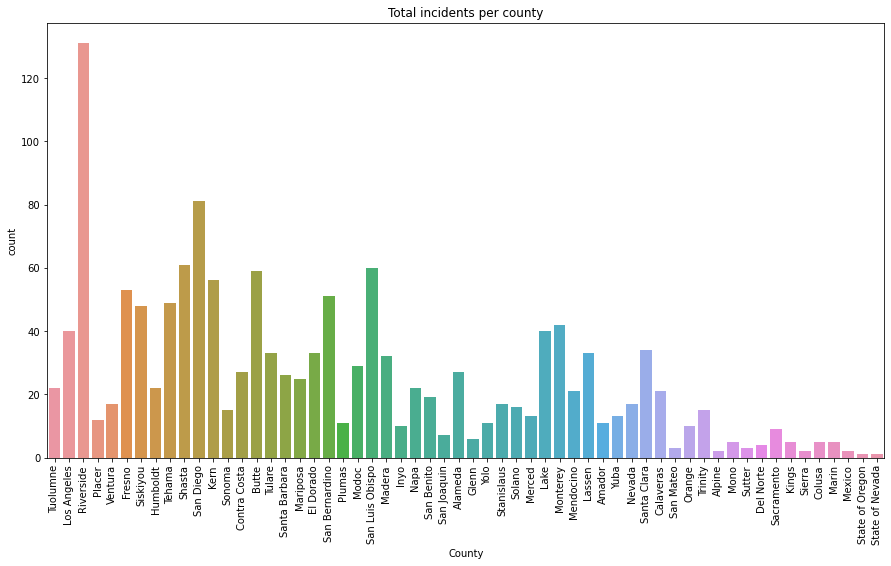

In [6]:
data = df4[df4['County']!='Santa Cruz']
plt.figure(figsize=(15,8))
sns.countplot(x = data.County)
plt.xticks(rotation=90)
plt.title('Total incidents per county')

### What are the top 20 affected counties?

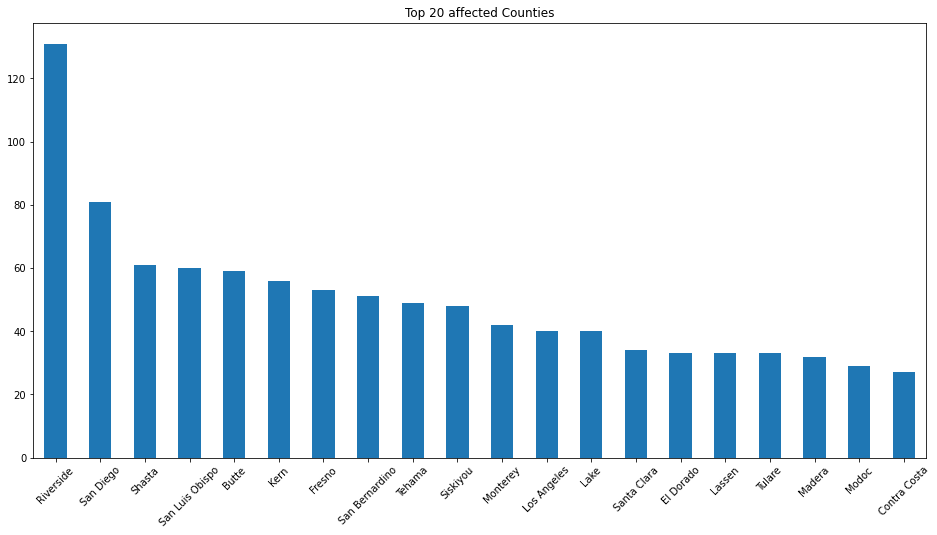

In [7]:
plt.figure(figsize=(16,8))
df4.County.value_counts()[0:20].plot(kind='bar')
plt.xticks(rotation=45)
plt.title('Top 20 affected Counties')
plt.show()

### How does latitude & longitude map the incidents?

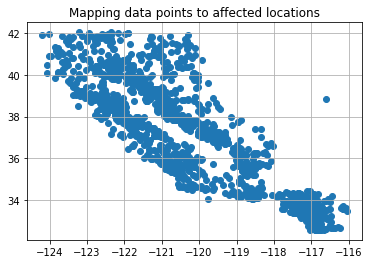

In [8]:
df_select = df4[df4.Longitude<-115]
df_select = df_select[(df_select.Latitude<44) & (df_select.Latitude > 30)]
plt.scatter(df_select.Longitude, df_select.Latitude)
plt.grid()
plt.title('Mapping data points to affected locations')
plt.show()

In [9]:
df5 = pd.read_sql_query("""SELECT AcresBurned,Year FROM Incident_Details""", conn_norm)
display(df5)

,AcresBurned,Year
0,257314.0,2013
1,30274.0,2013
2,27531.0,2013
3,27440.0,2013
4,24251.0,2013
...,...,...
1444,9.0,2019
1445,2.0,2019
1446,100.0,2019
1447,100.0,2019


### What amount of total loss in vegetation or destruction has california experienced over the years?

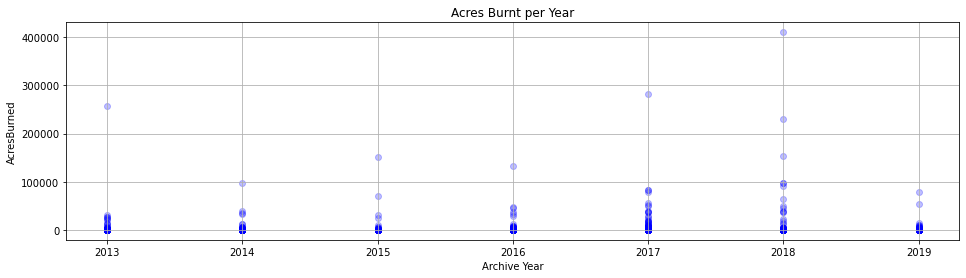

In [10]:
plt.figure(figsize=(16,4))
plt.scatter(df5.Year, df5.AcresBurned, color='blue', alpha=0.25)
plt.xlabel('Archive Year')
plt.ylabel('AcresBurned')
plt.title('Acres Burnt per Year')
plt.grid()
plt.show()

### In which month does wildfire incidents increase for the last 7 years?

In [11]:
df6 = pd.read_sql_query("""SELECT StartDate,AcresBurned,Year FROM Incident_Details""", conn_norm)
df6 = df6[df6['AcresBurned'] != 0]
dates = pd.to_datetime(df6['StartDate'])
df6['StartedMonth'] = [x.month for x in dates]
df6['Year'] = [x.year for x in dates]
monthly_count = df6.groupby(["Year","StartedMonth"])['AcresBurned'].count().reset_index(name="WildfireCount")
monthly_count = monthly_count[(monthly_count['WildfireCount'] < 100) & (monthly_count['Year'] > 2010)]

fig = px.line(monthly_count, x = "StartedMonth", y = "WildfireCount", color = "Year", height=600, title='Widefire Count in Each Month, 2013-2020')
fig.show()


### Do more frequent fires lead to more number of fatalities?

In [12]:
df = pd.read_sql_query("""SELECT Year, Fatalities FROM Incident_Details;""", conn_norm)
display(df)

,Year,Fatalities
0,2013,0
1,2013,0
2,2013,0
3,2013,0
4,2013,0
...,...,...
1444,2019,0
1445,2019,0
1446,2019,0
1447,2019,0


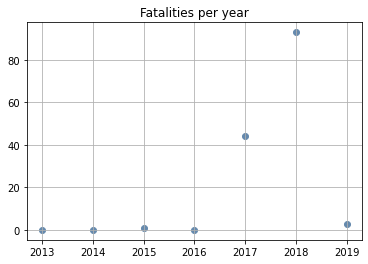

In [13]:
# fatalities per year
fatalities_sum = df.groupby(by='Year').Fatalities.sum()
plt.scatter(fatalities_sum.index, fatalities_sum, color = "#6589AD")
plt.grid()
plt.title('Fatalities per year')
plt.show()

This graph shows that the number of fatalities are directly proportional to the number of fires and the acres burned in the county

### Are the number of fire incidents surging with the passing of years?

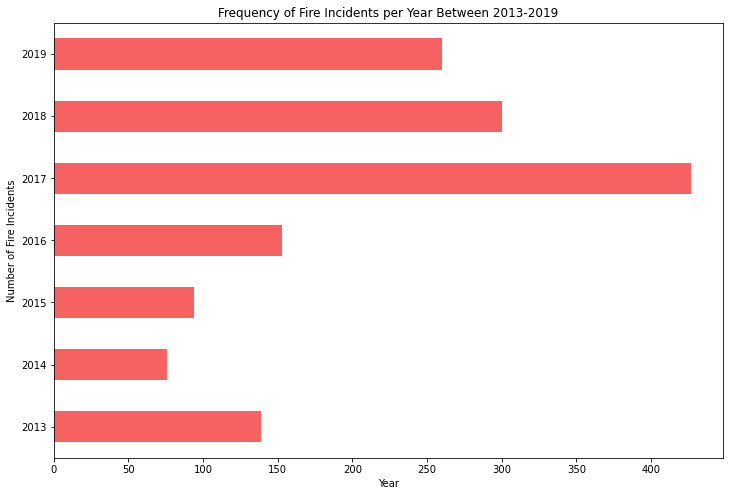

In [14]:
df['Year'].value_counts().sort_index().plot(kind='barh', figsize=(12,8), color = "#F76161")
plt.xlabel('Year')
plt.ylabel('Number of Fire Incidents')
plt.title('Frequency of Fire Incidents per Year Between 2013-2019');

### Which County has the highest impact from the wildfires?

In [15]:
def as_thousand(value):
    return value/1_000;

query = """select County, AcresBurned, Fatalities, Duration, Year
from Incident_Details join Location_Details using(LocationID)
join County_Details using(CountyID)"""

df4 = pd.read_sql_query(query, conn_norm)
display(df4)

,County,AcresBurned,Fatalities,Duration,Year
0,Tuolumne,257314.0,0,20.125000,2013
1,Los Angeles,30274.0,0,9.125000,2013
2,Riverside,27531.0,0,15.166667,2013
3,Placer,27440.0,0,19.625000,2013
4,Ventura,24251.0,0,8.958333,2013
...,...,...,...,...,...
1444,Riverside,9.0,0,0.250000,2019
1445,Nevada,2.0,0,0.083333,2019
1446,Yolo,100.0,0,0.000000,2019
1447,San Diego,100.0,0,0.000000,2019


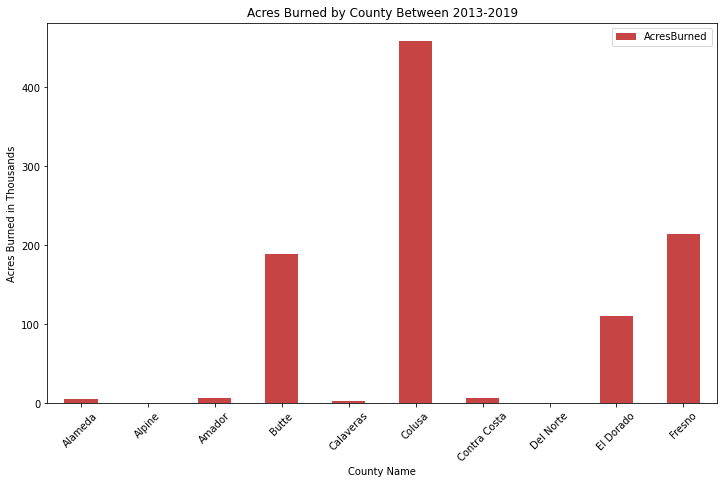

In [16]:
countyBurn = df4[['County', 'AcresBurned']].groupby('County').sum().head(10).apply(as_thousand)
countyBurn.plot(kind='bar', color = "#C64444", figsize=(12,7)) 
plt.xticks(rotation=45)
plt.xlabel('County Name')
plt.ylabel('Acres Burned in Thousands')
plt.title('Acres Burned by County Between 2013-2019');

### Relationship between Fatalities, Fire Duration and Acres Burned

#### Does it happen that the number of Fatalities increase with the increase in  <br/>
#### i) the Acres Burned, or <br/>
#### ii) the total Duration of the fires?

C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:306: UserWarning:

Dataset has 0 variance; skipping density estimate.

C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:306: UserWarning:

Dataset has 0 variance; skipping density estimate.

C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:306: UserWarning:

Dataset has 0 variance; skipping density estimate.



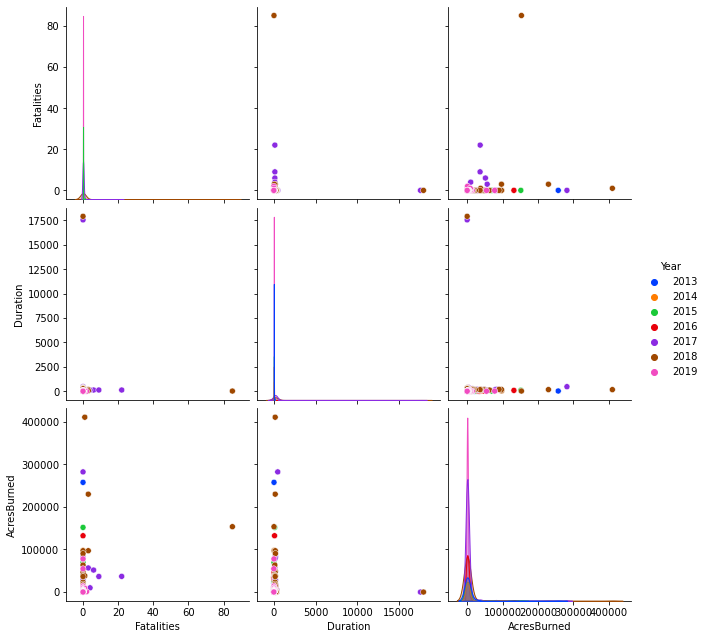

In [17]:
sns.pairplot(df4, vars = ['Fatalities', 'Duration', 'AcresBurned'], 
             diag_kind = 'kde', hue = "Year", height= 3, palette="bright")

### Geo-Plot of wildfires for a Particular Year

In [18]:
incident_df = pd.read_sql_query("""SELECT LocationID, AcresBurned, Year FROM Incident_Details""", conn_norm)
location_df = pd.read_sql_query("""SELECT LocationID, CountyID, Latitude, Longitude  FROM Location_Details""", conn_norm)

In [19]:
YEAR = 2015

In [20]:
import folium

MAX_RADIUS = 20
MIN_RADIUS = 1

maxAreaBurned = max(incident_df['AcresBurned'])

colour = '#ff0000'

m = folium.Map(location=[36.7783, -119.4179], zoom_start=5)


fires_in_year = incident_df[incident_df['Year'] == YEAR]

for index, row in fires_in_year.iterrows():
    location = location_df[location_df['LocationID'] == row['LocationID']]
    lat = location['Latitude']
    long = location['Longitude']
    radius = 2 + (row['AcresBurned']/maxAreaBurned)*20;

    folium.CircleMarker(
        location=[lat, long],
        radius=radius,
        popup=str(YEAR) + ": " + "Acres Burned: " + str(row['AcresBurned']),
        color=colour,
        fill=True,
        fill_color=colour,
    ).add_to(m)
m

### Geo-Plots of wildfire for all Year

In [21]:
import folium

MAX_RADIUS = 20
MIN_RADIUS = 1

years = range(2013, 2021)

m = folium.Map(location=[36.7783, -119.4179], zoom_start=5)

for year, colour in zip (years, ['#ffda00', '#ffa100', '#eb4e40', '#ce3400', '#eb4e40', '#ff7200', '#ff3900', '#ff0000' ]):
    fires_in_year = incident_df[incident_df['Year'] == year]

    for index, row in fires_in_year.iterrows():
        location = location_df[location_df['LocationID'] == row['LocationID']]
        lat = location['Latitude']
        long = location['Longitude']
        radius = 2 + (row['AcresBurned']/maxAreaBurned)*20;

        folium.CircleMarker(
            location=[lat, long],
            radius=radius,
            popup=str(year) + ": " + "Acres Burned: " + str(row['AcresBurned']),
            color=colour,
            fill=True,
            fill_color=colour,
        ).add_to(m)
m

### Total Impact of Wildfire per County

In [22]:
county_df = pd.read_sql_query("""SELECT CountyID, County FROM County_Details""", conn_norm)

In [23]:
import branca
import json

with open('ca-county-boundaries.geojson') as f:
    states_topo = json.load(f)

counties = {}

AreasBurnedPerCounty = pd.merge(location_df, incident_df, on=['LocationID']).groupby(['CountyID']).sum()['AcresBurned']
AreasBurnedPerCounty = AreasBurnedPerCounty.astype(int)
maxAreaBurned = max(AreasBurnedPerCounty)

colorscale = branca.colormap.LinearColormap(
    ['yellow', 'red'],
    vmin=0, vmax=1
)

def style_function(feature):
    c = county_df[county_df['County'] == feature['properties']['name']]
    if not c.empty:
        countyID = c.iloc[0]['CountyID']
        areaBurned = 100000*AreasBurnedPerCounty.at[str(countyID)]/feature['properties']['aland']
        num = areaBurned;
    else:
        num = maxAreaBurned/2
    return {
        "fillOpacity": 0.5,
        "weight": 0,
        "fillColor": "#black" if num is None else colorscale(num),
    }

m = folium.Map(location=[36.7783, -119.4179], tiles="cartodbpositron", zoom_start=5)

folium.GeoJson(states_topo, name="geojson", style_function=style_function).add_to(m)

m

<ipython-input-23-162bd3fb8b41>:22: RuntimeWarning:

overflow encountered in long_scalars



### Conclusions
While there are a couple of suprises with the data, overall the results support our hypothesis that fires are generally <br><br>

<li> Becoming more frequent
<li> Burning more acreage
<li> Causing more death and destruction with each passing year
<br><br>
    
With the continued rise in average temperature, higher prevalence of drought, 
and the continued development of land for housing along previously wild areas, 
    fires will most likely continue to get larger, more frequent, and continue 
    to cause large amounts of property damage and loss of life within the state.


### What can we do about this?
Our changing climate and drought conditions are issues on a scale that will take a large amount of cooperation, and to some extent there's no way to reverse some of those changes.

What we can do is prepare on a local level, and think about planning for the future of the state.
<br><br>
<li>Avoid building housing near wild, undeveloped areas which are at greater risk of fire. The solution may be more and denser housing near urban and suburban cores.
<li>Putting in place early warning systems and ensuring each populated area has an evacuation plan to avoid loss of life.
<li>Creating defensible space around buildings.
<li>Improvements in forest management and use of controlled burns to remove highly flammable material to reduce intensity of wildfires.

In [24]:
## END ##